In [1]:
#!/usr/bin/env python3.6
# -*- coding: utf-8 -*-

In [2]:
# Imports
import sys
import math
import numpy as np
from matplotlib import animation
from IPython.display import HTML
from matplotlib import pyplot as plt
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
import mpl_toolkits.mplot3d.axes3d as p3

In [3]:
np.random.seed(20)
np.set_printoptions(threshold=sys.maxsize)

In [4]:
%matplotlib inline

# Data

In [5]:
# Read data
motion = np.genfromtxt('../dataset3/com_data/odom_full_continuous_2minutes.csv', delimiter=',', dtype=np.float64)
print("Motion data has a length of ", len(motion))

Motion data has a length of  190581


In [6]:
motion.shape

(190581, 32)

## Visualizations

In [7]:
"""
    Plot a 4x2 grid of comparing data.
"""
def plot_non_overlapping_data(dataset, data:list, idxs: list):
    fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4,2, figsize=(20,15))
    fig.suptitle('Heigh-Force (Idle)')

    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Height (FL)')

    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Force (FL)')

    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_xlabel('Time')
    ax3.set_ylabel('Height (FR)')

    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_xlabel('Time')
    ax4.set_ylabel('Force (FR)')

    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_xlabel('Time')
    ax5.set_ylabel('Height (RL)')

    ax6.plot(dataset[data[2], 0], datasetD[data[2], idxs[5]], 'g-')
    ax6.set_xlabel('Time')
    ax6.set_ylabel('Force (RL)')

    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_xlabel('Time')
    ax7.set_ylabel('Height (RR)')

    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_xlabel('Time')
    ax8.set_ylabel('Force (RR)')

    fig.tight_layout()

    plt.show()
 
"""
    Plot data on overlapping graph. 
"""
def plot_overlapping_data(title: str, dataset, data: list, idxs: list, draw_footsteps=None, footsteps_timestamp=None):
    fig, (ax1, ax3, ax5, ax7) = plt.subplots(4,1, figsize=(20,15))
    fig.suptitle(title)
    
    # FL plot (height)
    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_ylabel('Height (FL)', color='b')
    ax1.set_xlabel('Time')
         
    # FL plot (force)
    ax2 = ax1.twinx()
    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_ylabel('Force (FL)', color='g')
          
    # FR plot (height)
    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_ylabel('Height (FR)', color='b')
    ax3.set_xlabel('Time')
         
    # FR plot (force)
    ax4 = ax3.twinx()
    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_ylabel('Force(FR)', color='g')      
          
    # RL plot (height)
    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_ylabel('Height (RL)', color='b')
    ax5.set_xlabel('Time')
         
    # RL plot (force)
    ax6 = ax5.twinx()
    ax6.plot(dataset[data[2], 0], dataset[data[2], idxs[5]], 'g-')
    ax6.set_ylabel('Force (RL)', color='g')   
          
    # RR plot (height)
    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_ylabel('Height (RR)', color='b')
    ax7.set_xlabel('Time')
         
    # RR plot (force)
    ax8 = ax7.twinx()
    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_ylabel('Force (RR)', color='g')

    for ax in [ax2, ax4, ax6, ax8]:
        for tl in ax.get_yticklabels():
            tl.set_color('g')
    
    for ax in [ax1, ax3, ax5, ax7]:
        for tl in ax.get_yticklabels():
            tl.set_color('b')
    
    # Draw footsteps
    if draw_footsteps:
        for ax in [ax1, ax3, ax5, ax7]:
            for footstep_timestamp in footsteps_timestamp:
                if footstep_timestamp <= max(dataset[data[0], 0]) and footstep_timestamp >= min(dataset[data[0], 0]):
                    #print("Timestamp: ", footstep_timestamp)
                    ax.axvline(x=footstep_timestamp, color='r', linestyle='-')
                    #ax.axvline(x=footstep_timestamp+0.15, color='b', linestyle='-')
    
    fig.tight_layout()
    plt.show()

## Height-Force plots

In [8]:
def get_specific_cmd(dataset, fwd, side, rot):
    if abs(fwd): 
        return np.where(dataset[:, 1] > 0)[0] if fwd > 0 else np.where(dataset[:, 1] < 0)[0]
    if abs(side): 
        return np.where(dataset[:, 2] > 0)[0] if side > 0 else np.where(dataset[:, 2] < 0)[0]
    if abs(rot): 
        return np.where(dataset[:, 6] > 0)[0] if rot > 0 else np.where(dataset[:, 6] < 0)[0]

In [9]:
def get_swinging_motions(dataset, height=-0.1):
    # FR min height (i.e swining motion)
    fr_min_height = np.where(dataset[:, 9] < height)[0]
    fl_min_height = np.where(dataset[:, 12] < height)[0]
    rr_min_height = np.where(dataset[:, 15] < height)[0]
    rl_min_height = np.where(dataset[:, 18] < height)[0]
            
    return fr_min_height,fl_min_height,rr_min_height,rl_min_height

## motion

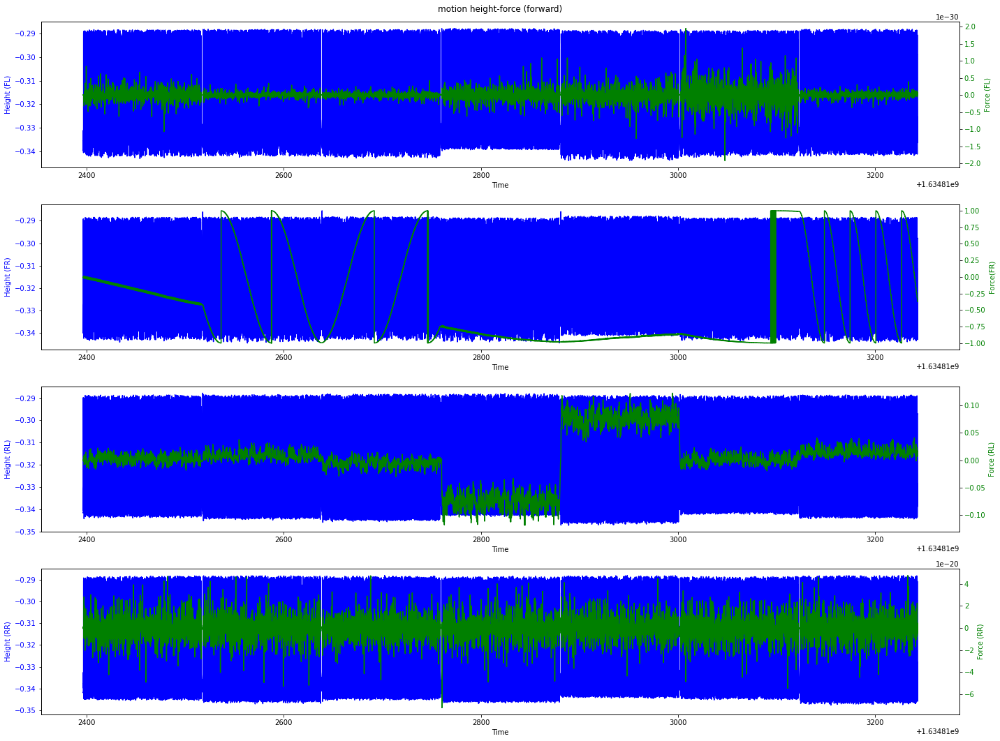

In [10]:
# Forward
fwd_cmds = get_specific_cmd(motion, 1, 0, 0)
motion_fwd = motion[fwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_fwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (forward)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

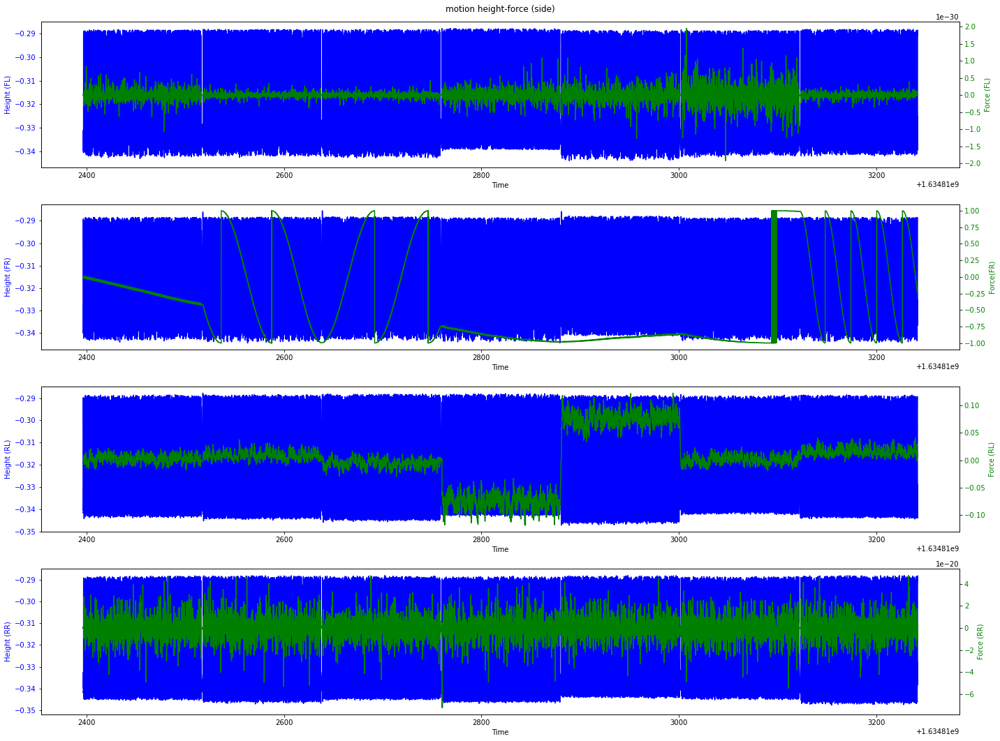

In [11]:
# Side (right)
side_cmds = get_specific_cmd(motion, 0, -1, 0)
motion_side = motion[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (side)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

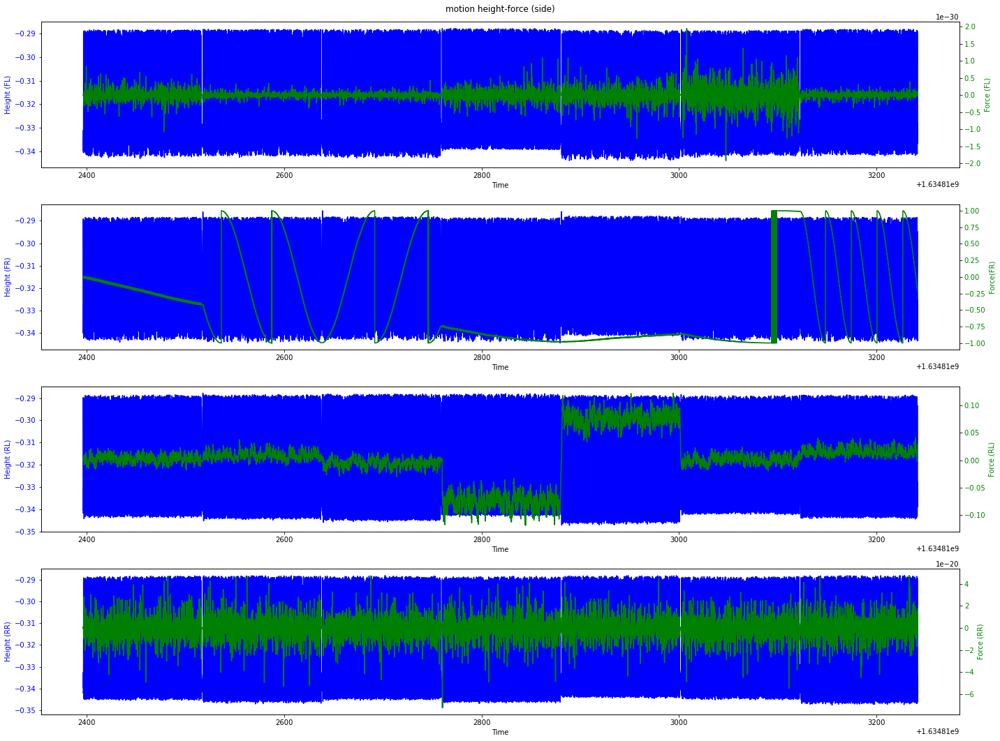

In [12]:
# Side (left)
side_cmds = get_specific_cmd(motion, 0, 1, 0)
motion_side = motion[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (side)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

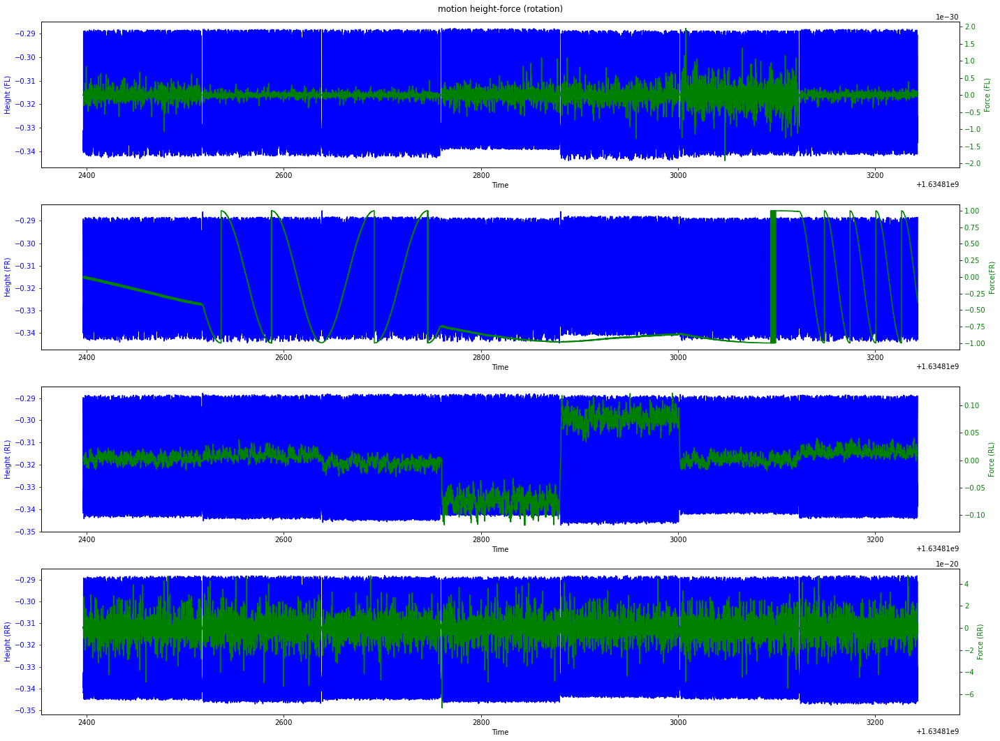

In [13]:
# Rotation (clockwise)
rot_cmds = get_specific_cmd(motion, 0, 0, -1)
motion_rot = motion[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (rotation)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

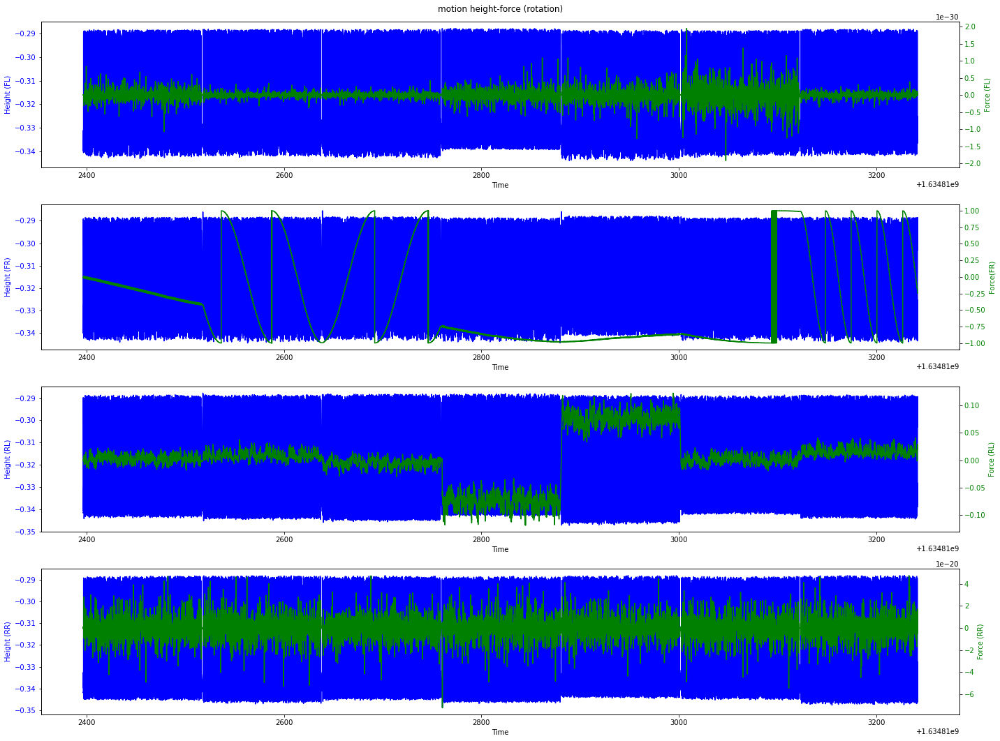

In [14]:
# Rotation (counter clockwise)
rot_cmds = get_specific_cmd(motion, 0, 0, 1)
motion_rot = motion[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (rotation)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

## Footsteps Extraction (Height + Force)

In [15]:
"""
    Extract footsteps from raw data using
    force and height measurements together.
"""
def extract_footsteps(dataset, height_threshold=0.1, force_thresholds=[100,100,100,100]):
    # Compute height difference for FR and FL
    fr_fl_diff = np.round(abs(dataset[:, 9] - dataset[:, 12]), 9)
    print("Max diff between fr and fl: ", max(fr_fl_diff))

    # Compute height difference for RR and RL
    rr_rl_diff = np.round(abs(dataset[:, 15] - dataset[:, 18]), 9)
    print("Max diff between rr and rl: ", max(rr_rl_diff))

    # Compute compound difference for all foots
    height_diff = np.round(fr_fl_diff + rr_rl_diff, 9)
    print("Min and max diff between front and rear feet", min(height_diff), max(height_diff), "\n")
    
    # Find footsteps (based on height difference)
    footsteps_height = np.where(height_diff < height_threshold)[0]
    print("Amount of footsteps found with height criteria: ", len(footsteps_height), "\n")
    
    # Find footsteps based on force perceived
    rear_force_footsteps = np.where(np.logical_or(dataset[:, 21] <= force_thresholds[0], dataset[:, 24] <= force_thresholds[1]))[0]
    front_force_footsteps = np.where(np.logical_or(dataset[:, 27] <= force_thresholds[2], dataset[:, 30] <= force_thresholds[3]))[0]
    
    # Find footsteps that match force constraints on all foot
    footsteps_force = np.intersect1d(rear_force_footsteps, front_force_footsteps)
    print("Number of force footsteps: ", len(footsteps_force), "\n")
    
    # Find force and height footsteps intersection
    force_height_footsteps = np.intersect1d(footsteps_force, footsteps_height)
    print("Number of height-force footsteps: ", len(force_height_footsteps), "\n")
    
    return force_height_footsteps


"""
    Perform non-maximum-suppresion on the 
    footsteps found as multiple instances
    are found within a small time window.
"""
def footsteps_nms(dataset, footsteps):
    idx = 0
    footsteps_nms = []
    footstep_to_add = footsteps[0]
    
    while idx < (len(footsteps) - 1):
        # Compute time difference between current and next footsteps
        time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
        
        # Find corresponding index in between
        # the current and next footsteps
        time_differences = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference/2))
        matching_index = time_differences.argmin()
        
        # Retrieve maximum height between foosteps
        height_peek_in_between = max([dataset[matching_index, x] for x in [9, 12, 15, 18]])
        
        # Within same time window but not consecute footsteps
        if time_difference < 0.1 and not height_peek_in_between > -0.31:
            # Compute height difference between feet
            #height_diff_idx = abs(dataset[footsteps[idx], 9] - dataset[footsteps[idx], 12]) + abs(dataset[footsteps[idx], 15] - dataset[footsteps[idx], 18])
            #height_diff_idx_next = abs(dataset[footsteps[idx+1], 9] - dataset[footsteps[idx+1], 12]) + abs(dataset[footsteps[idx+1], 15] - dataset[footsteps[idx+1], 18])
                
            # Choose foot with lowest height difference
            #footstep_to_add = footsteps[idx] if height_diff_idx < height_diff_idx_next else footsteps[idx+1]
            #timestamp_of_footstep_to_add = dataset[footsteps[idx], 0] if height_diff_idx < height_diff_idx_next else dataset[footsteps[idx+1], 0] 
            
            footstep_to_add = footsteps[idx] if dataset[footsteps[idx], 0] < dataset[footsteps[idx+1], 0] else footsteps[idx+1]
        elif time_difference < 0.1 and height_peek_in_between > -0.31:
            footsteps_nms.append(footstep_to_add)
        elif time_difference > 0.1:
            footsteps_nms.append(footstep_to_add)
        
        idx += 1
    
    # Remove redundant detections
    idx = 0
    footstep_nms_final = []
    while idx < (len(footsteps_nms) - 1):
        if abs(dataset[footsteps_nms[idx], 0] - dataset[footsteps_nms[idx+1], 0]) > 0.1:
            footstep_nms_final.append(footsteps_nms[idx])
        
        idx += 1
        
    return np.asarray(footstep_nms_final)

## Footsteps

In [17]:
def footstep_extraction_and_plotting(dataset, velocities, height_threshold, force_thresholds, indexes):
    # Extract backward motion entries
    cmds = get_specific_cmd(dataset, velocities[0], velocities[1], velocities[2])
    motion_cmds = motion[cmds]
    fr_min_height, fl_min_height, rr_min_height, rl_min_height = get_swinging_motions(motion_cmds)
    print("Foot swinging motions lenghts: ", len(fr_min_height), len(fl_min_height), len(rr_min_height), len(rl_min_height))
    
    # Extract footsteps
    footsteps = extract_footsteps(motion_cmds, height_threshold, force_thresholds)
    print("Footsteps extracted: ", len(footsteps))
    
    # Footsteps NMS
    footsteps_after_nms = footsteps_nms(motion_cmds, footsteps)
    print("Footsteps after non-maximum-suppression: ", len(footsteps_after_nms))
    
    # Plot footsteps
    sample_walking_fr_height = fr_min_height[indexes]
    sample_walking_fl_height = fl_min_height[indexes]
    sample_walking_rr_height = rr_min_height[indexes]
    sample_walking_rl_height = rl_min_height[indexes]

    plot_overlapping_data("Footsteps",
                          motion_cmds,
                          [sample_walking_fr_height, 
                           sample_walking_fl_height,
                           sample_walking_rr_height,
                           sample_walking_rl_height],
                           [9, 21, 12, 24, 15, 27, 18, 30],
                           True,
                           motion_cmds[footsteps_nms(motion_cmds, footsteps), 0])
                           #motion_cmds[footsteps, 0])
 
    return motion_cmds, footsteps_after_nms

### Forward motion

In [18]:
#np.diff(motion_fwd[footsteps_fwd, 0])

Foot swinging motions lenghts:  38146 38146 38146 38146
Max diff between fr and fl:  0.047646284
Max diff between rr and rl:  0.049890012
Min and max diff between front and rear feet 0.000106841 0.097209901 

Amount of footsteps found with height criteria:  23255 

Number of force footsteps:  38146 

Number of height-force footsteps:  23255 

Footsteps extracted:  23255
Footsteps after non-maximum-suppression:  2581


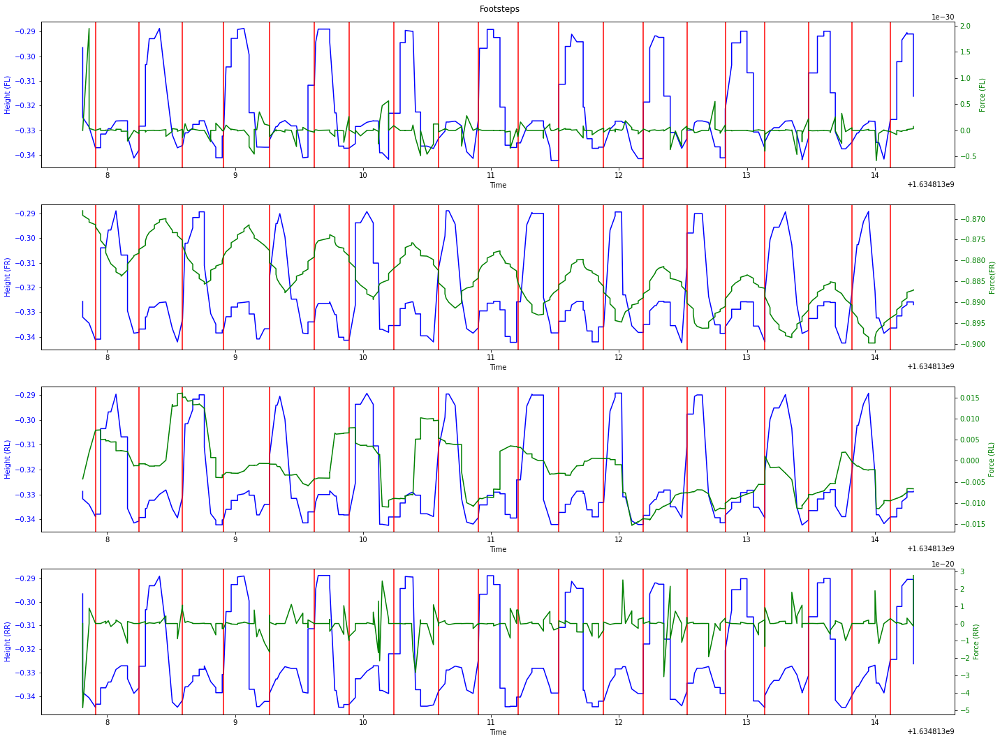

In [24]:
motion_fwd, footsteps_fwd = footstep_extraction_and_plotting(dataset=motion, velocities=[1, 0, 0], height_threshold=0.06, force_thresholds=[100,100,100,100], indexes=range(5700, 6000))

### Side motion (right)

Foot swinging motions lenghts:  38107 38107 38107 38107
Max diff between fr and fl:  0.047130823
Max diff between rr and rl:  0.052620322
Min and max diff between front and rear feet 5.7608e-05 0.099645883 

Amount of footsteps found with height criteria:  22567 

Number of force footsteps:  38107 

Number of height-force footsteps:  22567 

Footsteps extracted:  22567
Footsteps after non-maximum-suppression:  2581


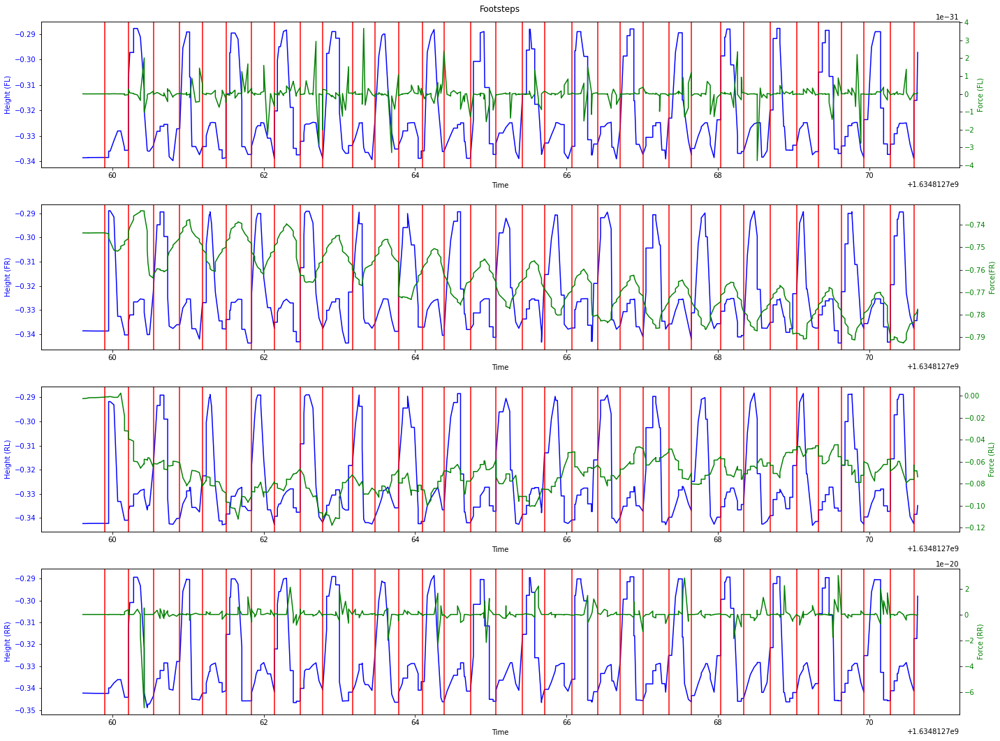

In [25]:
motion_side_right, footsteps_side_right = footstep_extraction_and_plotting(dataset=motion, velocities=[0, -1, 0],  height_threshold=0.06, force_thresholds=[100,100,100,100], indexes=range(0, 500))

### Side (left)

Foot swinging motions lenghts:  38088 38088 38088 38088
Max diff between fr and fl:  0.049065411
Max diff between rr and rl:  0.04943344
Min and max diff between front and rear feet 3.5763e-05 0.097175121 

Amount of footsteps found with height criteria:  22576 

Number of force footsteps:  38088 

Number of height-force footsteps:  22576 

Footsteps extracted:  22576
Footsteps after non-maximum-suppression:  2581


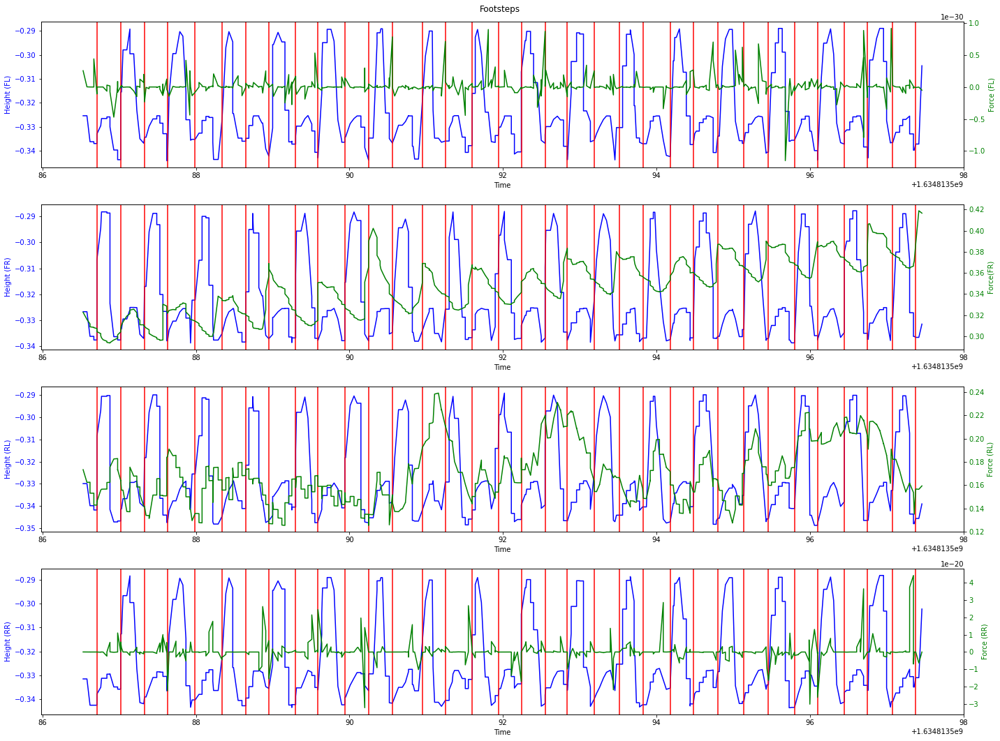

In [26]:
motion_side_left, footsteps_side_left = footstep_extraction_and_plotting(dataset=motion, velocities=[0, 1, 0],  height_threshold=0.06, force_thresholds=[100,100,100,100], indexes=range(10000, 10500))

### Rotation (clockwise)

Foot swinging motions lenghts:  38148 38148 38148 38148
Max diff between fr and fl:  0.048621356
Max diff between rr and rl:  0.051244587
Min and max diff between front and rear feet 7.9692e-05 0.098970681 

Amount of footsteps found with height criteria:  23027 

Number of force footsteps:  38148 

Number of height-force footsteps:  23027 

Footsteps extracted:  23027
Footsteps after non-maximum-suppression:  2581


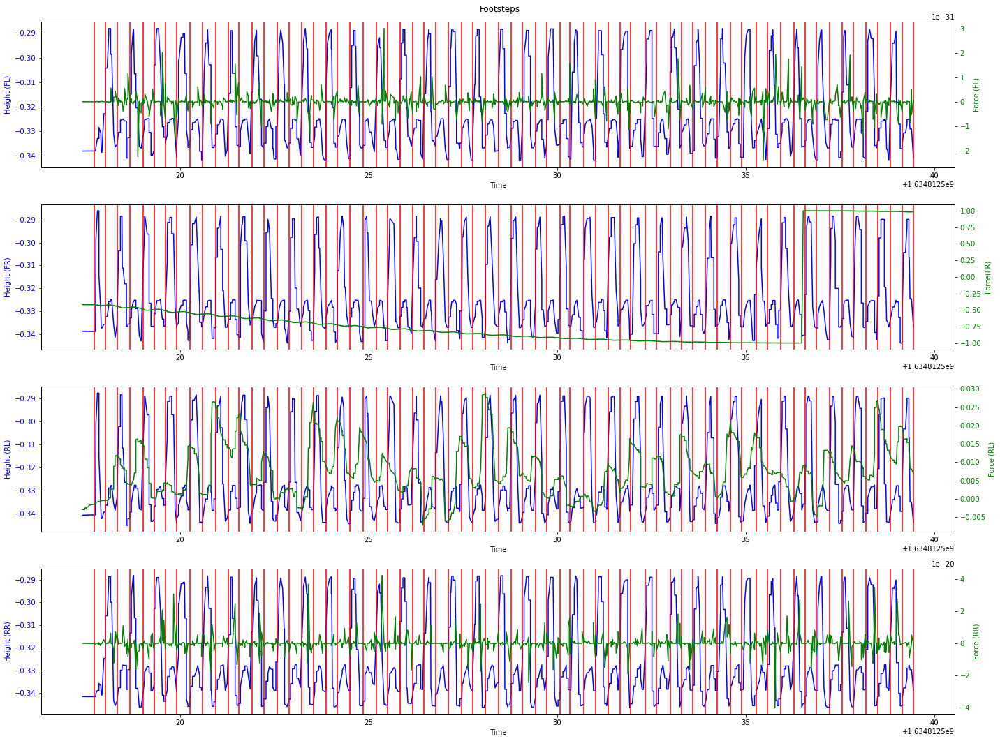

In [28]:
motion_clock, footsteps_clock = footstep_extraction_and_plotting(dataset=motion, velocities=[0, 0, -1],  height_threshold=0.06, force_thresholds=[100,100,100,100], indexes=range(0, 1000))

### Rotation (counter clockwise)

Foot swinging motions lenghts:  38092 38092 38092 38092
Max diff between fr and fl:  0.049123019
Max diff between rr and rl:  0.04964301
Min and max diff between front and rear feet 0.000204354 0.098697454 

Amount of footsteps found with height criteria:  23101 

Number of force footsteps:  38092 

Number of height-force footsteps:  23101 

Footsteps extracted:  23101
Footsteps after non-maximum-suppression:  2581


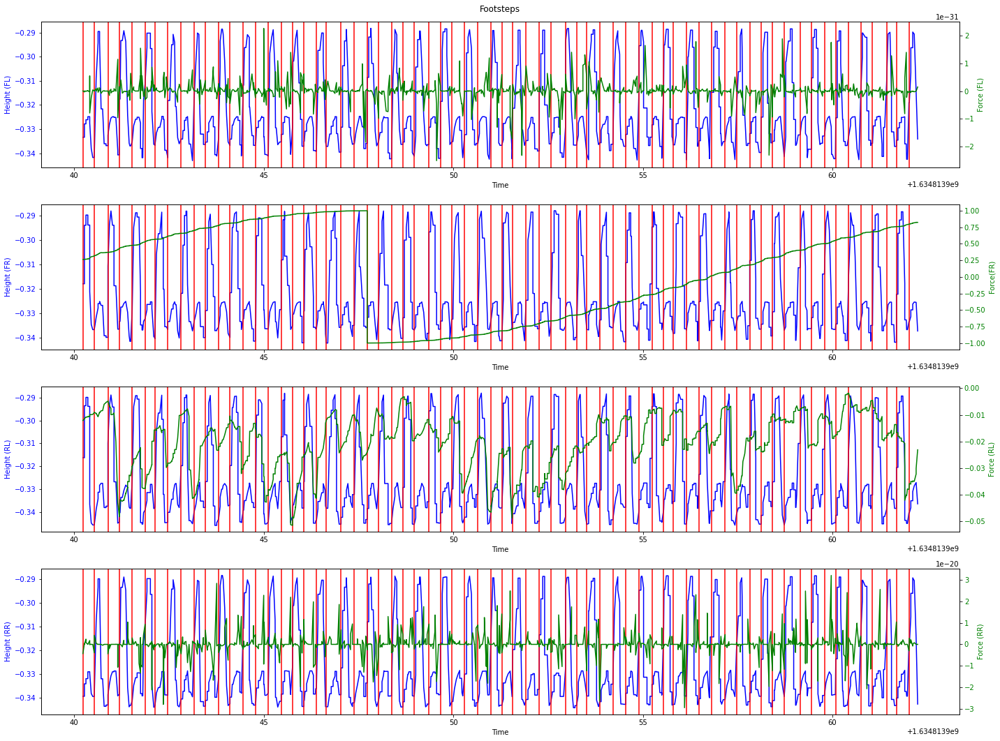

In [29]:
motion_count, footsteps_count = footstep_extraction_and_plotting(dataset=motion, velocities=[0, 0, 1],  height_threshold=0.06, force_thresholds=[100,100,100,100], indexes=range(15000, 16000))

### CoM displacement

In [30]:
def euler_from_quaternion(x, y, z, w):
    """
    Convert a quaternion into euler angles (roll, pitch, yaw)
    roll is rotation around x in radians (counterclockwise)
    pitch is rotation around y in radians (counterclockwise)
    yaw is rotation around z in radians (counterclockwise)
    """
    t0 = +2.0 * (w * x + y * z)
    t1 = +1.0 - 2.0 * (x * x + y * y)
    roll_x = math.atan2(t0, t1)
     
    t2 = +2.0 * (w * y - z * x)
    t2 = +1.0 if t2 > +1.0 else t2
    t2 = -1.0 if t2 < -1.0 else t2
    pitch_y = math.asin(t2)
     
    t3 = +2.0 * (w * z + x * y)
    t4 = +1.0 - 2.0 * (y * y + z * z)
    yaw_z = math.atan2(t3, t4)
     
    return roll_x, pitch_y, yaw_z # in radians

In [93]:
def getCoMStep(dataset, footsteps, velocities, swinging, displacement_type, threshold=0.02):
    base_yaw = []
    base_velocity_x = []
    base_velocity_y = []
    base_velocity_yaw = []
    base_displacement_x = []
    base_displacement_y = []
    support_base_displacement_x = []
    support_base_displacement_y = []
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
        
        velocity_check = np.isclose(velocities[0], dataset[footstep, 1]) and np.isclose(velocities[1], dataset[footstep, 2]) and np.isclose(velocities[2], dataset[footstep, 6])
        
        if idx < (len(footsteps) - 1) and velocity_check:
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.4 and time_difference > 0:
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                                
                if (not fr_moving != fl_moving):
                    print("Exception")
                    continue
                    
                # Get euler angles from odom to base rotation
                _, _, curr_yaw = euler_from_quaternion(dataset[footstep, 22], dataset[footstep, 23], dataset[footstep, 24], dataset[footstep, 25])
                _, _, next_yaw = euler_from_quaternion(dataset[footsteps[idx+1], 22], dataset[footsteps[idx+1], 23], dataset[footsteps[idx+1], 24], dataset[footsteps[idx+1], 25])

                # Compute rotation matrix
                c_curr, s_curr = np.cos(curr_yaw), np.sin(curr_yaw)
                c_next, s_next = np.cos(next_yaw), np.sin(next_yaw)
                R_curr = np.array(((c_curr, -s_curr), (s_curr, c_curr)))
                R_next = np.array(((c_next, -s_next), (s_next, c_next)))
                
                # Odom base vectors
                curr_base = np.array([[dataset[footstep, 19], dataset[footstep, 20]]])
                next_base = np.array([[dataset[footsteps[idx+1], 19], dataset[footsteps[idx+1], 20]]])
                
                # Local base vectors
                local_curr_base = R_curr.T @ curr_base.T
                local_next_base = R_curr.T @ next_base.T
                local_next_base_next = R_next.T @ next_base.T
                base_displacement = local_next_base - local_curr_base
                                        
                # Feet displacements
                fl_x_displacement = dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]
                fl_y_displacement = dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]
                fr_x_displacement = dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]
                fr_y_displacement = dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]
                rl_x_displacement = dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]
                rl_y_displacement = dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]
                rr_x_displacement = dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]
                rr_y_displacement = dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]
                
                # Support foot base displacement
                support_base_displacement = [0, 0]
                if fr_moving and swinging:
                    base_yaw.append(next_yaw - curr_yaw)
                    base_velocity_x.append(dataset[footstep, 26])
                    base_velocity_y.append(dataset[footstep, 27])
                    base_velocity_yaw.append(dataset[footstep, 31])
                    base_displacement_x.append(base_displacement.tolist()[0])
                    base_displacement_y.append(base_displacement.tolist()[1])
                    support_base_displacement_x.append(fr_x_displacement)
                    support_base_displacement_y.append(fr_y_displacement)
                elif fl_moving and not swinging:
                    base_yaw.append(next_yaw - curr_yaw)
                    base_velocity_x.append(dataset[footstep, 26])
                    base_velocity_y.append(dataset[footstep, 27])
                    base_velocity_yaw.append(dataset[footstep, 31])
                    base_displacement_x.append(base_displacement.tolist()[0])
                    base_displacement_y.append(base_displacement.tolist()[1])
                    support_base_displacement_x.append(fl_x_displacement)
                    support_base_displacement_y.append(fl_y_displacement)
                
    if displacement_type == "odom":
        return base_yaw, base_displacement_x, base_displacement_y, base_velocity_x, base_velocity_y, base_velocity_yaw
    else:
        return base_yaw, support_base_displacement_x, support_base_displacement_y

In [94]:
def log_motions_stats(dataset, footsteps, motion, fr_swiging, data_type):    
    motion_np = np.array(motion)
    for velocity in [.1, .2, .3, .4, .5, .6, .7]:
        com_yaw, com_x, com_y = getCoMStep(dataset, footsteps, motion_np * velocity, fr_swiging, "odom")
        print(f'Motion: {motion_np * velocity}\n')
                
        print(f'Avg. com step yaw: {np.mean(com_yaw)}')
        print(f'Min com step yaw: {np.min(com_yaw)}')
        print(f'Max com step yaw: {np.max(com_yaw)}')
        print(f'Std com step yaw: {np.std(com_yaw)}\n')
        
        print(f'Avg. com step size (x): {np.mean(com_x)}')
        print(f'Min com step size (x): {np.min(com_x)}')
        print(f'Max com step size (x): {np.max(com_x)}')
        print(f'Std com step size (x): {np.std(com_x)}\n')
        
        print(f'Avg. com step size (y): {np.mean(com_y)}')
        print(f'Min com step size (y): {np.min(com_y)}')
        print(f'Max com step size (y): {np.max(com_y)}')
        print(f'Std com step size (y): {np.std(com_y)}\n')

## Forward Stats

In [106]:
# X (FL)
forward_steps = []
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], False, "odom")[1])
forward_steps.extend(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], False, "odom")[1])

forward_x_velocity = []
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], False, "odom")[3])
forward_x_velocity.extend(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], False, "odom")[3])

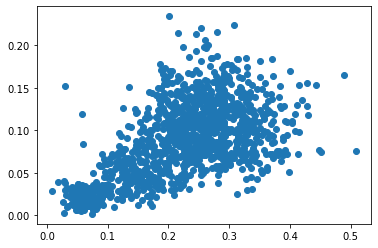

In [104]:
plt.scatter(forward_x_velocity, forward_steps)

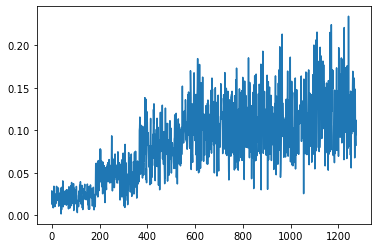

In [105]:
plt.plot(forward_steps)

### Stats

In [36]:
log_motions_stats(motion_fwd, footsteps_fwd, [1,0,0], False, "odom")

Motion: [0.1 0.  0. ]

Avg. com step yaw: -0.0034418874862685712
Min com step yaw: -0.025571511857615747
Max com step yaw: 0.01489328651979871
Std com step yaw: 0.007320783860736317

Avg. com step size (x): 0.021228874988544456
Min com step size (x): 0.0016599581644898276
Max com step size (x): 0.0405097028347583
Std com step size (x): 0.008407803540833262

Avg. com step size (y): 0.005994641696390104
Min com step size (y): 0.000861089497807388
Max com step size (y): 0.011602988927694735
Std com step size (y): 0.0029519474178006017

Motion: [0.2 0.  0. ]

Avg. com step yaw: -0.0018551022445775119
Min com step yaw: -6.279304259936136
Max com step yaw: 6.27953278472979
Std com step yaw: 0.6564958084301974

Avg. com step size (x): 0.046759590795744696
Min com step size (x): 0.009302150456909741
Max com step size (x): 0.09351456364673805
Std com step size (x): 0.015972352686552168

Avg. com step size (y): 0.005791017872962436
Min com step size (y): -0.00030943033203456594
Max com step size

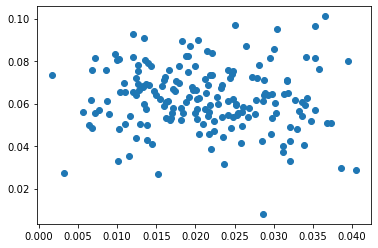

In [95]:
plt.scatter(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[1], getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[3])

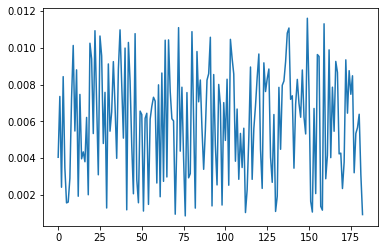

In [98]:
plt.plot(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[2])

#### FL/RR (x)

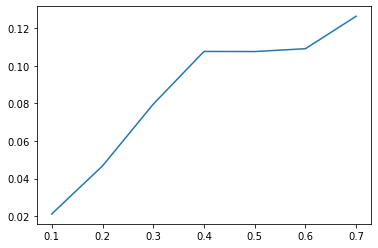

In [37]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], False, "odom")[1])])

#### FL/RR (y)

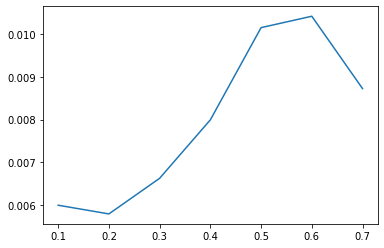

In [38]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], False, "odom")[2])])

In [39]:
log_motions_stats(motion_fwd, footsteps_fwd, [1,0,0], True, "odom")

Motion: [0.1 0.  0. ]

Avg. com step yaw: -0.001045271081330998
Min com step yaw: -0.022015368550933112
Max com step yaw: 0.01915828441531453
Std com step yaw: 0.00724095799776008

Avg. com step size (x): 0.01795090822283825
Min com step size (x): 0.0026315434632623314
Max com step size (x): 0.03754522854265385
Std com step size (x): 0.0069875114770528695

Avg. com step size (y): -0.0049509863183439225
Min com step size (y): -0.010923099226742172
Max com step size (y): -0.00044173166939715696
Std com step size (y): 0.002241757583663823

Motion: [0.2 0.  0. ]

Avg. com step yaw: 0.02892072670349323
Min com step yaw: -0.023878254483805428
Max com step yaw: 6.268711156884468
Std com step yaw: 0.462584016046428

Avg. com step size (x): 0.04469304753266605
Min com step size (x): 0.013065423704969437
Max com step size (x): 0.08327627596617226
Std com step size (x): 0.014807973341930914

Avg. com step size (y): -0.005876313195638879
Min com step size (y): -0.012308650899008455
Max com step si

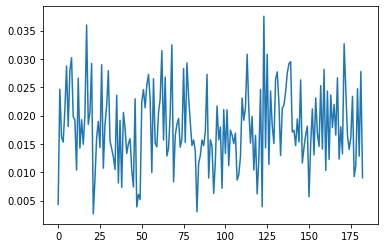

In [87]:
plt.plot(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], True, "odom")[1])

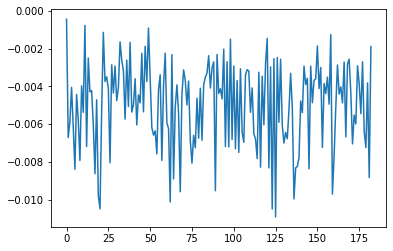

In [82]:
plt.plot(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], True, "odom")[2])

#### FR/RL (x)

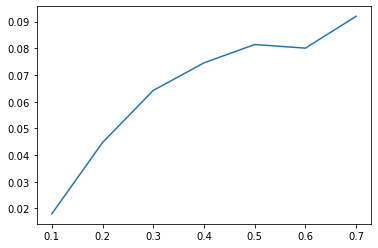

In [40]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], True, "odom")[1])])

#### FR/RL (y)

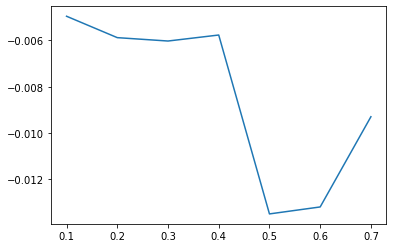

In [41]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.1, 0, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.2, 0, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.3, 0, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.4, 0, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.5, 0, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.6, 0, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_fwd, footsteps_fwd, [.7, 0, 0], True, "odom")[2])])

### Right

In [42]:
log_motions_stats(motion_side_right, footsteps_side_right, [0,-1,0], False, "odom")

Motion: [ 0.  -0.1  0. ]

Avg. com step yaw: -0.02191512141877851
Min com step yaw: -0.07846038634518937
Max com step yaw: 0.0058226430863652645
Std com step yaw: 0.01792995824688481

Avg. com step size (x): -0.0037829039750408994
Min com step size (x): -0.013021281133462459
Max com step size (x): 0.005354232362973388
Std com step size (x): 0.004289167962143386

Avg. com step size (y): -0.023281200487432766
Min com step size (y): -0.04063919040556874
Max com step size (y): -0.008306741705991882
Std com step size (y): 0.0062293724211213925

Motion: [ 0.  -0.2  0. ]

Avg. com step yaw: -0.026332190207225284
Min com step yaw: -0.12987222545826724
Max com step yaw: 0.014024647686181946
Std com step yaw: 0.031921938147351885

Avg. com step size (x): 0.0009921093939342068
Min com step size (x): -0.011585979785246892
Max com step size (x): 0.01148977287846975
Std com step size (x): 0.0047526667423837205

Avg. com step size (y): -0.05513917191359915
Min com step size (y): -0.09513827403868791


#### FL/RR (x)

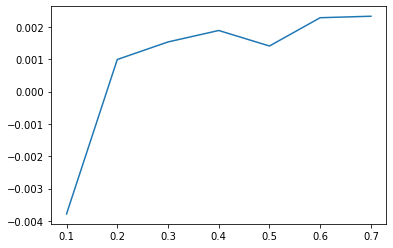

In [43]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.1, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.2, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.3, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.4, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.5, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.6, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.7, 0], False, "odom")[1])])

#### FL/RR (y)

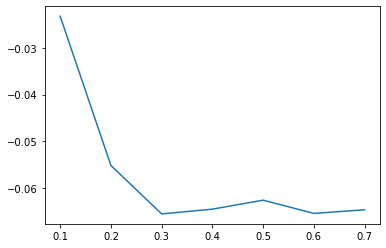

In [44]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.1, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.2, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.3, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.4, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.5, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.6, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.7, 0], False, "odom")[2])])

#### FR/RL (x)

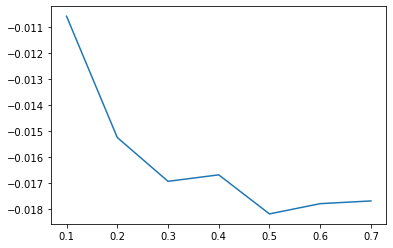

In [45]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.1, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.2, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.3, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.4, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.5, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.6, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.7, 0], True, "odom")[1])])

#### FR/RL (y)

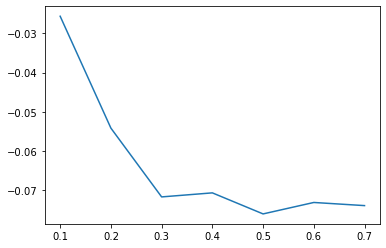

In [46]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.1, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.2, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.3, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.4, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.5, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.6, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_right, footsteps_side_right, [0, -0.7, 0], True, "odom")[2])])

### Left

In [47]:
log_motions_stats(motion_side_left, footsteps_side_left, [0,1,0], False, "odom")

Motion: [0.  0.1 0. ]

Avg. com step yaw: -0.011420943590793957
Min com step yaw: -0.06618452135958508
Max com step yaw: 0.013698904433199655
Std com step yaw: 0.016652552978262063

Avg. com step size (x): -0.009384274551337175
Min com step size (x): -0.018568323547752286
Max com step size (x): 0.0024754201108789786
Std com step size (x): 0.0033074232473993006

Avg. com step size (y): 0.026098466247157802
Min com step size (y): 0.00944462495306464
Max com step size (y): 0.04881998648617003
Std com step size (y): 0.0070622050910299035

Motion: [0.  0.2 0. ]

Avg. com step yaw: -0.026627384442400214
Min com step yaw: -0.11747877656132544
Max com step yaw: 0.024554118196124484
Std com step yaw: 0.03863953538351794

Avg. com step size (x): -0.011357275075517766
Min com step size (x): -0.02354878618588785
Max com step size (x): -0.002843233744037832
Std com step size (x): 0.0036856880933991572

Avg. com step size (y): 0.052850408061925515
Min com step size (y): 0.016080429877419533
Max com 

#### FL/RR (x)

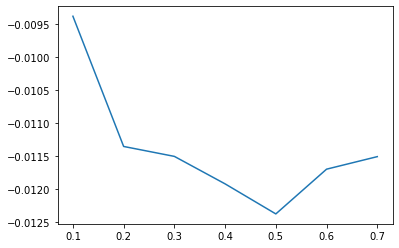

In [48]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.1, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.2, 0], False, "odom")[1]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.3, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.4, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.5, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.6, 0], False, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.7, 0], False, "odom")[1])])

#### FL/RR (y)

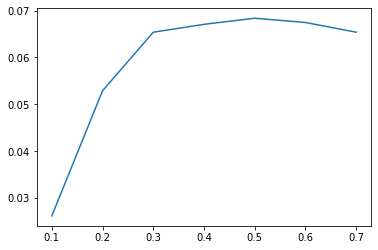

In [49]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.1, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.2, 0], False, "odom")[2]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.3, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.4, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.5, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.6, 0], False, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.7, 0], False, "odom")[2])])

#### FR/RL (x)

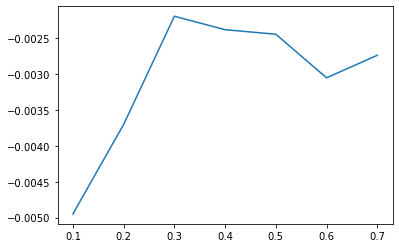

In [50]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.1, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.2, 0], True, "odom")[1]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.3, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.4, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.5, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.6, 0], True, "odom")[1]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.7, 0], True, "odom")[1])])

#### FR/RL (y)

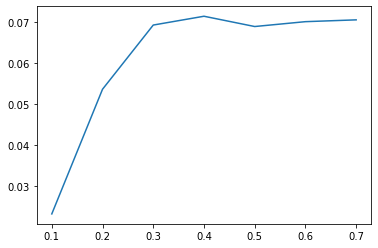

In [51]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.1, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.2, 0], True, "odom")[2]), 
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.3, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.4, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.5, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.6, 0], True, "odom")[2]),
          np.mean(getCoMStep(motion_side_left, footsteps_side_left, [0, 0.7, 0], True, "odom")[2])])

### Clockwise

In [52]:
log_motions_stats(motion_clock, footsteps_clock, [0,0,-1], False, "odom")

Motion: [ 0.   0.  -0.1]

Avg. com step yaw: 0.02255324781927117
Min com step yaw: -0.07325832970061064
Max com step yaw: 6.241020227176431
Std com step yaw: 0.652884455392944

Avg. com step size (x): -0.007019605300899868
Min com step size (x): -0.017440588952091662
Max com step size (x): 0.005083366155915314
Std com step size (x): 0.004384304816484647

Avg. com step size (y): 0.007682703196730449
Min com step size (y): 0.0006442110926112576
Max com step size (y): 0.01746130592065409
Std com step size (y): 0.0035503985054413153

Motion: [ 0.   0.  -0.2]

Avg. com step yaw: 0.02219959816335711
Min com step yaw: -0.10534049207109712
Max com step yaw: 6.213736441655074
Std com step yaw: 0.8028995943709809

Avg. com step size (x): -0.006198157592242231
Min com step size (x): -0.018307242109703914
Max com step size (x): 0.009428537191347619
Std com step size (x): 0.004866260726003658

Avg. com step size (y): 0.009973886614856138
Min com step size (y): 0.0015619505561801361
Max com step siz

#### FL/RR (x)

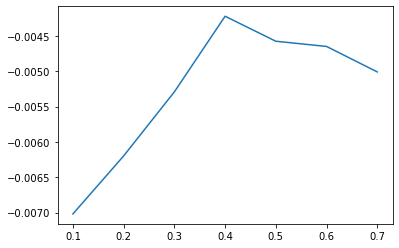

In [53]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.1], False, "odom")[1]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.2], False, "odom")[1]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.3], False, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.4], False, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.5], False, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.6], False, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.7], False, "odom")[1])])

#### FL/RR (y)

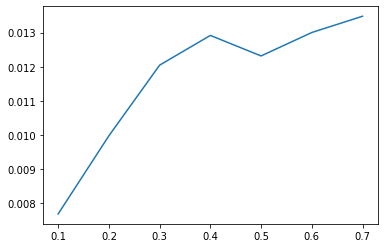

In [54]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.1], False, "odom")[2]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.2], False, "odom")[2]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.3], False, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.4], False, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.5], False, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.6], False, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.7], False, "odom")[2])])

#### FR/RL (x)

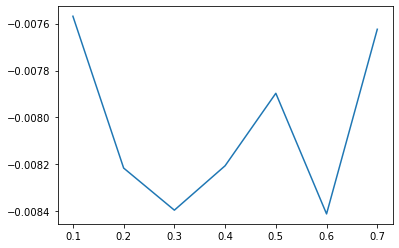

In [55]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.1], True, "odom")[1]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.2], True, "odom")[1]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.3], True, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.4], True, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.5], True, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.6], True, "odom")[1]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.7], True, "odom")[1])])

#### FR/RL (y)

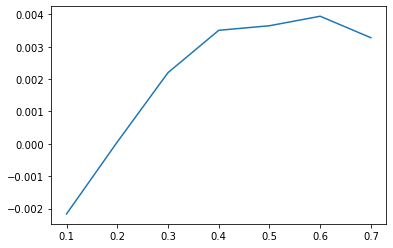

In [56]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.1], True, "odom")[2]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.2], True, "odom")[2]), 
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.3], True, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.4], True, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.5], True, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.6], True, "odom")[2]),
          np.mean(getCoMStep(motion_clock, footsteps_clock, [0, 0, -.7], True, "odom")[2])])

### Counter Clockwise

In [57]:
log_motions_stats(motion_count, footsteps_count, [0,0,1], False, "odom")

Motion: [0.  0.  0.1]

Avg. com step yaw: -0.0034059902446773424
Min com step yaw: -6.257603135246413
Max com step yaw: 0.049158136632321714
Std com step yaw: 0.4623803465827283

Avg. com step size (x): -0.0066085557890718915
Min com step size (x): -0.015530507634038848
Max com step size (x): 0.0018641628313624814
Std com step size (x): 0.004045212577949533

Avg. com step size (y): 0.003242392234687641
Min com step size (y): -0.00189288381453534
Max com step size (y): 0.008309607992521784
Std com step size (y): 0.0025109559263218773

Motion: [0.  0.  0.2]

Avg. com step yaw: 0.03316790531921233
Min com step yaw: -6.218837200428958
Max com step yaw: 0.09172879350594587
Std com step yaw: 0.46350943687861285

Avg. com step size (x): -0.006239323052307761
Min com step size (x): -0.01639972063754591
Max com step size (x): 0.004593237846103548
Std com step size (x): 0.004192917197420888

Avg. com step size (y): 0.0010886698306199186
Min com step size (y): -0.0052830634053124825
Max com step 

#### FL/RR (x)

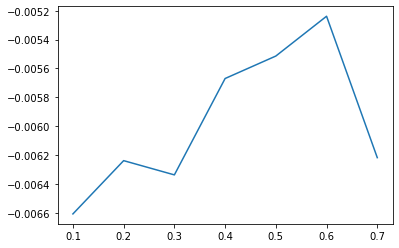

In [58]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .1], False, "odom")[1]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .2], False, "odom")[1]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .3], False, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .4], False, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .5], False, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .6], False, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .7], False, "odom")[1])])

#### FL/RR (y)

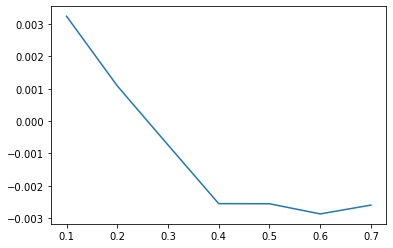

In [59]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .1], False, "odom")[2]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .2], False, "odom")[2]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .3], False, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .4], False, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .5], False, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .6], False, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .7], False, "odom")[2])])

#### FR/RL (x)

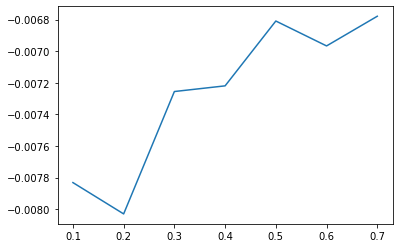

In [60]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .1], True, "odom")[1]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .2], True, "odom")[1]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .3], True, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .4], True, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .5], True, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .6], True, "odom")[1]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .7], True, "odom")[1])])

#### FR/RL (y)

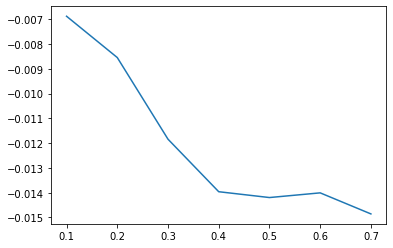

In [61]:
plt.plot([.1, .2, .3, .4, .5, .6, .7],
         [np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .1], True, "odom")[2]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .2], True, "odom")[2]), 
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .3], True, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .4], True, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .5], True, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .6], True, "odom")[2]),
          np.mean(getCoMStep(motion_count, footsteps_count, [0, 0, .7], True, "odom")[2])])

### Footstep visualization

In [62]:
def visualize_static_foosteps(dataset, footsteps):
    old_xs = None
    old_ys = None
    old_zs = None
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
        
        time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
        # 3D positions        
        xs = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
        ys = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
        zz = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()

        #print(xs, ys, zs, dataset[footstep, 2:5], dataset[footstep, 25:28])
        if idx > 0 and idx < len(footsteps):
            print(f'Diff: {time_diff}. Command: {dataset[footstep, 1:7]}. Coord: {[xs[0], ys[0], zs[0]]}. Step size: {[xs[0]-old_xs[0], ys[0]-old_ys[0], zs[0]-old_zs[0]]}.')
        else:
            print(f'Command: {dataset[footstep, 1:7]}. Coord: {[xs[0], ys[0], zs[0]]}.')
            
        old_xs = xs
        old_ys = ys
        old_zs = zs

In [63]:
def update_points(num, dataset, footsteps, x, y, z, points):    
    # Starting footstep index
    footstep = footsteps[num]
    
    # Round footsteps position
    dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)

    # Initial footsteps 3D positions
    new_x = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
    new_y = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
    new_z = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

    # update properties
    points.set_data(new_x, new_y)
    points.set_3d_properties(new_z, 'z')

    # return modified artists
    return points

def visualize_animated_footsteps(dataset, footsteps, style: str):
    # Create figure
    fig = plt.figure()
    ax = p3.Axes3D(fig)

    # Setting the axes properties
    ax.set_xlim3d([-0.4, 0.4])
    ax.set_xlabel('X')

    ax.set_ylim3d([-0.2, 0.2])
    ax.set_ylabel('Y')

    ax.set_zlim3d([-0.5, 0.5])
    ax.set_zlabel('Z')

    # Starting footstep index
    footstep = footsteps[0]

    # Round footsteps position
    dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)

    # Initial footsteps 3D positions
    x = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
    y = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
    z = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

    txt = fig.suptitle('')
    points, = ax.plot(x, y, z, style)
    
    # blit=True re-draws only the parts that have changed.
    anim = animation.FuncAnimation(fig, update_points, frames=len(footsteps), fargs=(dataset, footsteps, x, y, z, points))
    
    return anim   

In [66]:
def visualize_absolute_foostep_sizes(dataset, footsteps, threshold=0.02):
    prev_yaw = 0
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
        
        if idx < (len(footsteps) - 1):
            print("Command: ", dataset[footstep, 1:3], dataset[footstep, 6])
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.4 and time_difference > 0:
                fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
                axes[0].set_xlabel('X Label')
                axes[0].set_ylabel('Y Label')
                axes[1].set_xlabel('X Label')
                axes[1].set_ylabel('Y Label')
    
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                                
                if (not fr_moving != fl_moving):
                    print("Exception")
                    continue
                    
                # Get euler angles from odom to base rotation
                _, _, curr_yaw = euler_from_quaternion(dataset[footstep, 22], dataset[footstep, 23], dataset[footstep, 24], dataset[footstep, 25])
                _, _, next_yaw = euler_from_quaternion(dataset[footsteps[idx+1], 22], dataset[footsteps[idx+1], 23], dataset[footsteps[idx+1], 24], dataset[footsteps[idx+1], 25])

                # Compute rotation matrix
                c_curr, s_curr = np.cos(curr_yaw), np.sin(curr_yaw)
                c_next, s_next = np.cos(next_yaw), np.sin(next_yaw)
                R_curr = np.array(((c_curr, -s_curr), (s_curr, c_curr)))
                R_next = np.array(((c_next, -s_next), (s_next, c_next)))
                
                # Odom base vectors
                curr_base = np.array([[dataset[footstep, 19], dataset[footstep, 20]]])
                next_base = np.array([[dataset[footsteps[idx+1], 19], dataset[footsteps[idx+1], 20]]])
                
                # Local base vectors
                local_curr_base = R_curr.T @ curr_base.T
                local_next_base = R_curr.T @ next_base.T
                local_next_base_next = R_next.T @ next_base.T
                base_displacement = local_next_base - local_curr_base
                
                #print("Footstep timestamp: ", dataset[footstep, 0])
                print(f'\nFL moving: {fl_moving}. FR moving: {fr_moving}')
                print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')
                
                print("CoM displacement: ")
                print(f'FL (x): {dataset[footsteps[idx], 7]}, {dataset[footsteps[idx+1], 7]}, FL (y): {dataset[footsteps[idx], 8]}, {dataset[footsteps[idx+1], 8]}.')
                print(f'FL displacement: {(dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]).tolist()}, {(dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]).tolist()}.\n')
                
                print(f'FR (x): {dataset[footsteps[idx], 10]}, {dataset[footsteps[idx+1], 10]}, FR (y): {dataset[footsteps[idx], 11]}, {dataset[footsteps[idx+1], 11]}.')
                print(f'FR displacement: {(dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]).tolist()}, {(dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]).tolist()}.\n')
                
                print(f'RL (x): {dataset[footsteps[idx], 13]}, {dataset[footsteps[idx+1], 13]}, RL (y): {dataset[footsteps[idx], 14]}, {dataset[footsteps[idx+1], 14]}.')
                print(f'RL displacement: {(dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]).tolist()}, {(dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]).tolist()}.\n')
                
                print(f'RR (x): {dataset[footsteps[idx], 16]}, {dataset[footsteps[idx+1], 16]}, RR (y): {dataset[footsteps[idx], 17]}, {dataset[footsteps[idx+1], 17]}.')
                print(f'RR displacement: {(dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]).tolist()}, {(dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]).tolist()}.\n')
        
                # Feet displacements
                fl_x_displacement = dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]
                fl_y_displacement = dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]
                fr_x_displacement = dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]
                fr_y_displacement = dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]
                rl_x_displacement = dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]
                rl_y_displacement = dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]
                rr_x_displacement = dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]
                rr_y_displacement = dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]
                
                # Support foot base displacement
                support_base_displacement = [0, 0]
                if fr_moving:
                    support_base_displacement[0] = -fl_x_displacement
                    support_base_displacement[1] = -fl_y_displacement
                else:
                    support_base_displacement[0] = -fr_x_displacement
                    support_base_displacement[1] = -fr_y_displacement
                                    
                print(f'\nBase displacement (Foot): {support_base_displacement}.\n')
                print(f'Base displacement (Odom): {base_displacement.tolist()}. Rotation displacement: {(curr_yaw - prev_yaw) * 180 / np.pi}.\n')
                
                prev_yaw = curr_yaw
                    
                x_0 = np.array([dataset[footstep, 7], 
                                dataset[footstep, 10],
                                dataset[footstep, 13], 
                                dataset[footstep, 16]])
                y_0 = np.array([dataset[footstep, 8], 
                                dataset[footstep, 11],
                                dataset[footstep, 14], 
                                dataset[footstep, 17]])
                
                x_1 = np.array([dataset[footstep, 7] + fl_x_displacement, 
                                dataset[footstep, 10] + fr_x_displacement,
                                dataset[footstep, 13] + rl_x_displacement, 
                                dataset[footstep, 16] + rr_x_displacement])
                y_1 = np.array([dataset[footstep, 8] + fl_y_displacement, 
                                dataset[footstep, 11] + fr_y_displacement,
                                dataset[footstep, 14] + rl_y_displacement, 
                                dataset[footstep, 17] + rr_y_displacement])
                
                #axes[0].scatter(x_0, y_0, c= 'b',marker='o')
                axes[0].scatter(x_0, y_0, c= 'm',marker='o')
                axes[0].scatter(0, 0, c= 'g', marker='^')
                axes[0].scatter(base_displacement[0], base_displacement[1], c= 'y', marker='^')
                axes[0].scatter(support_base_displacement[0], support_base_displacement[1], c= 'r', marker='^')
                
                #axes[1].scatter(x_1, y_1, c= 'r', marker='o')
                axes[1].scatter(x_1, y_1, c= 'c', marker='o')
                
                plt.show()
                
#visualize_absolute_foostep_sizes(motion_fwd, footsteps_fwd, threshold=0.01)                  

### Forward motion

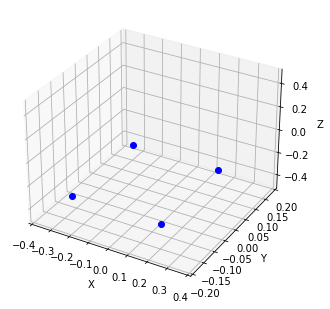

In [72]:
anim = visualize_animated_footsteps(motion_fwd, footsteps_fwd, "bo")
HTML(anim.to_html5_video())

### Side motion (right)

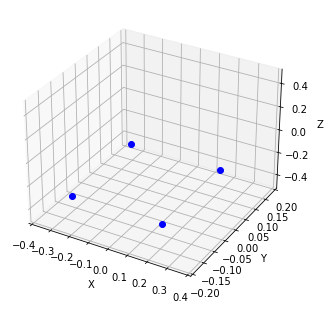

In [73]:
anim = visualize_animated_footsteps(motion_side_right, footsteps_side_right, "bo")
HTML(anim.to_html5_video())

### Side motion (left)

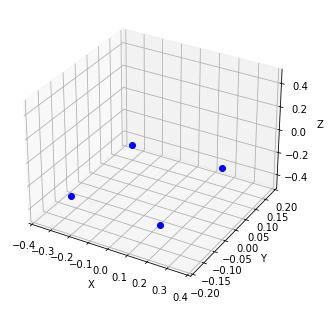

In [74]:
anim = visualize_animated_footsteps(motion_side_left, footsteps_side_left, "bo")
HTML(anim.to_html5_video())

### Rotation (clockwise)

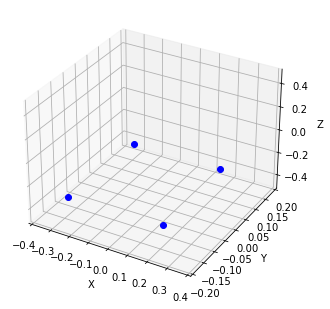

In [75]:
anim = visualize_animated_footsteps(motion_clock, footsteps_clock, "bo")
HTML(anim.to_html5_video())

### Rotation (counter clockwise)

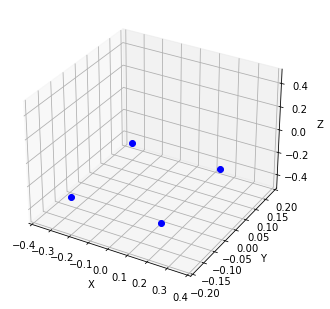

In [76]:
anim = visualize_animated_footsteps(motion_count, footsteps_count, "bo")
HTML(anim.to_html5_video())

# Dataset Preparation

In [68]:
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [70]:
def create_com_dataset(dataset, footsteps, motion=None, debug=False):
    # Footsteps sizes
    inputs = []
    labels = []
    prev_com_displacement = [0, 0]
    
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            # Compute time difference between
            # current and next footsteps
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.5 and time_difference > 0:
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                
                if debug:
                    print(idx, height_peeks_in_between)
                    print("Time difference: ", time_difference)
                    print("Footstep timestamp: ", dataset[footstep, 0])
                    print(f'FL moving: {fl_moving}. FR moving: {fr_moving}')
                    print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                if (not fr_moving != fl_moving):
                    print("Exception")
                    continue
                
                # Get euler angles from odom to base rotation
                _, _, curr_yaw = euler_from_quaternion(dataset[footstep, 22], dataset[footstep, 23], dataset[footstep, 24], dataset[footstep, 25])
                _, _, next_yaw = euler_from_quaternion(dataset[footsteps[idx+1], 22], dataset[footsteps[idx+1], 23], dataset[footsteps[idx+1], 24], dataset[footsteps[idx+1], 25])

                # Compute rotation matrix
                c_curr, s_curr = np.cos(curr_yaw), np.sin(curr_yaw)
                c_next, s_next = np.cos(next_yaw), np.sin(next_yaw)
                R_curr = np.array(((c_curr, -s_curr), (s_curr, c_curr)))
                R_next = np.array(((c_next, -s_next), (s_next, c_next)))
                
                # Odom base vectors
                curr_base = np.array([[dataset[footstep, 19], dataset[footstep, 20]]])
                next_base = np.array([[dataset[footsteps[idx+1], 19], dataset[footsteps[idx+1], 20]]])
                
                # Local base vectors
                local_curr_base = R_curr.T @ curr_base.T
                local_next_base = R_curr.T @ next_base.T
                base_displacement = local_next_base - local_curr_base
                
                # Inputs
                inputs.append(dataset[footsteps[idx], 1:7].tolist() + # Motion Command
                              dataset[footsteps[idx], 7:19].tolist() + # Relative feet positions
                              dataset[footsteps[idx], 26:32].tolist() + # Felt velocities
                              [fr_moving, fl_moving] + 
                              prev_com_displacement)
                
                labels.append(base_displacement.tolist()[0] + base_displacement.tolist()[1])
                
                #print(inputs[-1])
                #print(labels[-1])
                
                # Update base displacement
                prev_com_displacement = base_displacement.tolist()[0] + base_displacement.tolist()[1]
            else:
                print("Something here happened: ", time_difference, ", ", idx)
                prev_com_displacement = [0, 0]
                
    # Convert to numpy array
    inputs_numpy = np.array(inputs, dtype=object)
    labels_numpy = np.array(labels, dtype=object)
    
    return inputs_numpy, labels_numpy

X_motion_fwd_CoM, Y_motion_fwd_CoM = create_com_dataset(motion_fwd, footsteps_fwd, motion="forward")
X_motion_clock_CoM, Y_motion_clock_CoM = create_com_dataset(motion_clock, footsteps_clock, motion="clock")
X_motion_count_CoM, Y_motion_count_CoM = create_com_dataset(motion_count, footsteps_count, motion="count")
X_motion_side_left_CoM, Y_motion_side_left_CoM = create_com_dataset(motion_side_left, footsteps_side_left, motion="left")
X_motion_side_right_CoM, Y_motion_side_right_CoM = create_com_dataset(motion_side_right, footsteps_side_right, motion="right")

# Stack datasets
X_motion_CoM = np.concatenate((X_motion_fwd_CoM, X_motion_side_right_CoM, X_motion_side_left_CoM, X_motion_clock_CoM, X_motion_count_CoM))
Y_motion_CoM = np.concatenate((Y_motion_fwd_CoM, Y_motion_side_right_CoM, Y_motion_side_left_CoM, Y_motion_clock_CoM, Y_motion_count_CoM))
print(X_motion_CoM.shape)
print(Y_motion_CoM.shape)

Something here happened:  485.8400001525879 ,  368
Something here happened:  485.78000020980835 ,  737
Something here happened:  485.7300000190735 ,  1106
Something here happened:  485.7999999523163 ,  1475
Something here happened:  485.8599998950958 ,  1844
Something here happened:  485.82999992370605 ,  2213
Something here happened:  485.75999999046326 ,  368
Something here happened:  485.84999990463257 ,  737
Something here happened:  485.80999994277954 ,  1106
Something here happened:  485.83000016212463 ,  1475
Something here happened:  485.8100001811981 ,  1844
Something here happened:  485.7900002002716 ,  2213
Something here happened:  485.80999994277954 ,  368
Something here happened:  485.8399999141693 ,  737
Something here happened:  485.77999997138977 ,  1106
Something here happened:  485.77999997138977 ,  1475
Something here happened:  485.7699999809265 ,  1844
Something here happened:  485.80999994277954 ,  2213
Something here happened:  485.789999961853 ,  368
Something 

In [71]:
%store X_motion_CoM
%store Y_motion_CoM

Stored 'X_motion_CoM' (ndarray)
Stored 'Y_motion_CoM' (ndarray)


In [43]:
def labels_stats(dataset, title):
    print(f'Statistics for {title} CoM motion')
    
    print(f'CoM min x step: {min(dataset[:, 0])}. CoM max x step: {max(dataset[:, 0])}.')
    print(f'CoM min y step: {min(dataset[:, 1])}. CoM max y step: {max(dataset[:, 1])}.')
    print(f'CoM mean x step: {round(np.mean(dataset[:, 0]), 3)}. CoM mean y step: {round(np.mean(dataset[:, 1]), 3)}. CoM std x step: {round(np.std(dataset[:, 0]), 3)}. CoM std y step: {round(np.std(dataset[:, 1]), 3)}.\n')

labels_stats(Y_motion_fwd_CoM, "forward")
labels_stats(Y_motion_clock_CoM, "clockwise")
labels_stats(Y_motion_count_CoMD, "counter clockwise")
labels_stats(Y_motion_side_left_CoM, "left step")
labels_stats(Y_motion_side_right_CoM, "right step")

Statistics for forward CoM motion
CoM min x step: -0.30981806204829354. CoM max x step: 0.28062046362532556.
CoM min y step: -0.28743939652034634. CoM max y step: 0.30465744116211013.
CoM mean x step: -0.014. CoM mean y step: 0.002. CoM std x step: 0.057. CoM std y step: 0.057.

Statistics for clockwise CoM motion
CoM min x step: -0.05098542515787585. CoM max x step: 0.05144581790182201.
CoM min y step: -0.05438790652009118. CoM max y step: 0.05366461301756331.
CoM mean x step: -0.0. CoM mean y step: 0.0. CoM std x step: 0.016. CoM std y step: 0.016.

Statistics for counter clockwise CoM motion
CoM min x step: -0.03628533003430334. CoM max x step: 0.03377066618924118.
CoM min y step: -0.032317051282714004. CoM max y step: 0.034441938307756104.
CoM mean x step: -0.0. CoM mean y step: 0.0. CoM std x step: 0.01. CoM std y step: 0.01.

Statistics for left step CoM motion
CoM min x step: -0.15581582772000502. CoM max x step: 0.14926909647334696.
CoM min y step: -0.14527217202002785. CoM max